<span style="color:transparent;">Name and Title</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: left; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">
    Name: Siddhant Bahadkar<br>
    Title: A Deep Learning Approach for American Sign Language Alphabet Recognition</h1>
</div>

### Project Overview:

This project presents a deep learning-based approach to recognize the American Sign Language (ASL) Alphabet using Convolutional Neural Networks (CNNs) and pretrained transfer learning models such as VGG16, ResNet50, DenseNet201, InceptionV3, MobileNetV2, and a custom CNN.


#### Key Features:
* Implemented using Python and TensorFlow/Keras in a virtual environment.

* Trained and evaluated on a dataset with ~83,000 training images and 162 test images.

* Models include data augmentation, early stopping, model checkpointing, and fine-tuning strategies.

* Final outputs include classification metrics, confusion matrices, accuracy/loss plots, and a real-time webcam-based prediction interface.

In [ ]:
#Only uncomment and run this below line if you want to install the libraries
# pip install -r requirements.txt

<span style="color:transparent;">Import Required Libraries</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Import Required Libraries</h1>
</div>

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn as sns
import cv2
import pandas as pd
import plotly.graph_objects as go
import pickle
import json
import mediapipe as mp
import matplotlib.image as mpimg

from sklearn.metrics import classification_report
from plotly.subplots import make_subplots
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

#VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications import VGG16

#ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.applications import ResNet50

#DeseNet201
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.applications import DenseNet201

#InceptionV3
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

#Custom CNN
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, BatchNormalization
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2

#MobileNetV2
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input

import warnings
warnings.filterwarnings('ignore')

<span style="color:transparent;">VGG16</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">VGG16</h1>
</div>

<span style="color:transparent;">Configuration and Input Parameters</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Configuration and Input Parameters</h2>
</div>

In [2]:
# Set image parameters
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 16

<span style="color:transparent;">Dataset Paths</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Dataset Paths</h2>
</div>

In [3]:
train_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Train"   
test_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Test" 

<span style="color:transparent;">Data Generators with Augmentation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Data Generators with Augmentation</h2>
</div>

In [ ]:
train_val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=10,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_val_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_generator = train_val_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)

Found 66962 images belonging to 27 classes.
Found 16740 images belonging to 27 classes.


In [ ]:
#Test loader
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

class_names = list(train_generator.class_indices.keys())
print("Total classes:", len(class_names))
print("Classes:", class_names)

Found 162 images belonging to 27 classes.
Total classes: 27
Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


<span style="color:transparent;">Save Class Indices</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Class Indices</h2>
</div>

In [ ]:
# Save class_indices for consistent use later
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices.json", "w") as f:
    json.dump(train_generator.class_indices, f)

<span style="color:transparent;">Exploratory Data Analysis (EDA)</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Exploratory Data Analysis (EDA)</h2>
</div>

#### **EDA1**: Class distribution using countplot

C:\Users\Sid\AppData\Local\Temp\ipykernel_9664\1346732294.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_counts, x='class', y='image_count', palette='viridis')


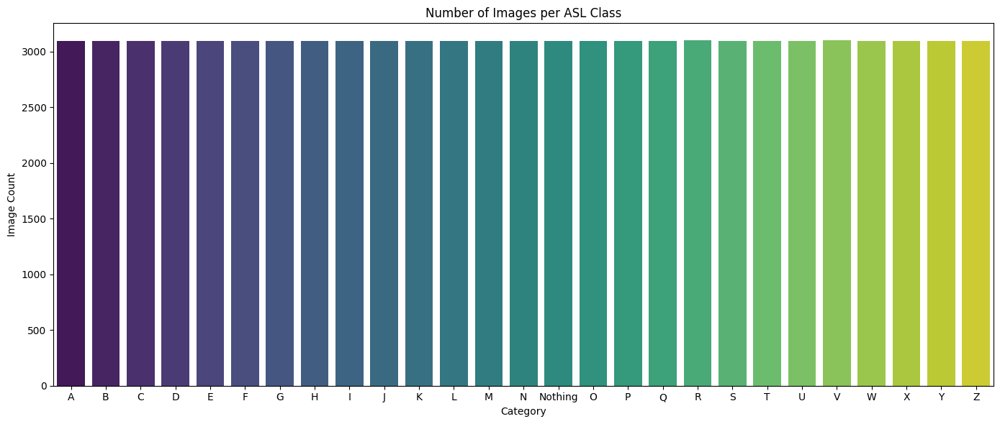

In [ ]:
class_counts = {}
for class_dir in sorted(os.listdir(train_dir)):
    class_path = os.path.join(train_dir, class_dir)
    if os.path.isdir(class_path):
        count = len(os.listdir(class_path))
        class_counts[class_dir] = count

df_counts = pd.DataFrame.from_dict(class_counts, orient='index', columns=['image_count'])
df_counts = df_counts.sort_index().reset_index().rename(columns={'index': 'class'})

plt.figure(figsize=(14, 6))
sns.barplot(data=df_counts, x='class', y='image_count', palette='viridis')
plt.title('Number of Images per ASL Class')
plt.xlabel('Category')
plt.ylabel('Image Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

#### **EDA2**: Sample montage showing one image from each class

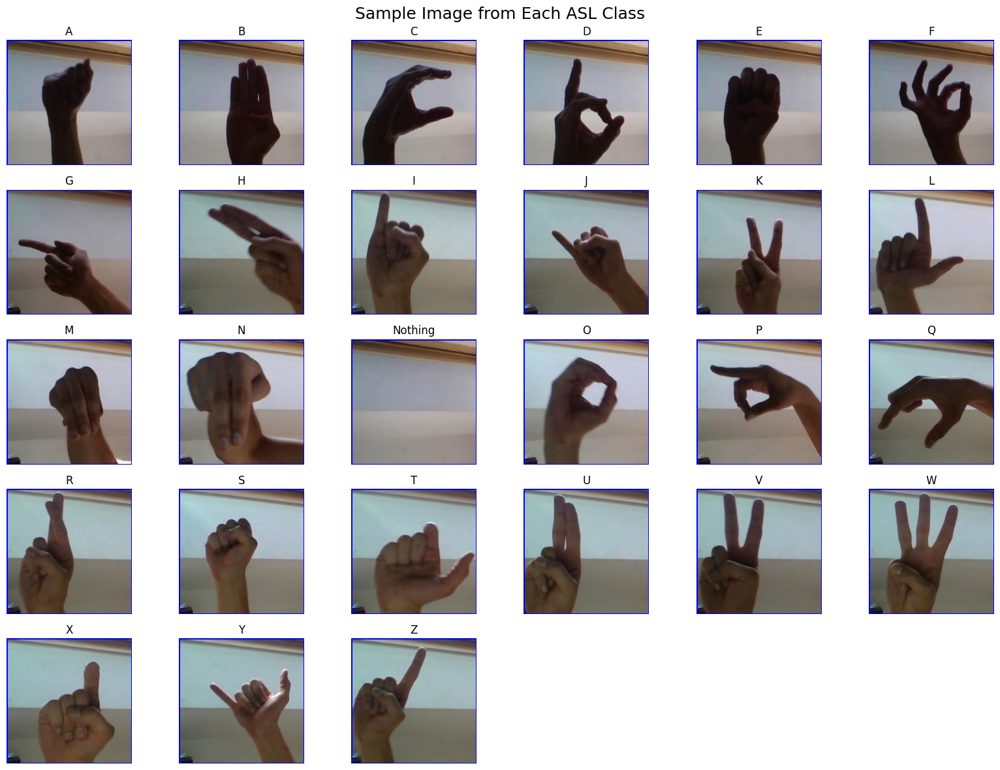

In [ ]:
plt.figure(figsize=(16, 12))
cols = 6
rows = (len(class_names) + cols - 1) // cols

for idx, class_name in enumerate(class_names):
    class_dir = os.path.join(train_dir, class_name)
    img_files = os.listdir(class_dir)
    if len(img_files) == 0:
        continue

    img_path = os.path.join(class_dir, img_files[0])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis('off')

plt.suptitle('Sample Image from Each ASL Class', fontsize=18)
plt.tight_layout()
plt.show()

In [7]:
# Get number of classes
num_classes = train_generator.num_classes

<span style="color:transparent;">Load Model Architecture</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Model Architecture</h2>
</div>

In [ ]:
# Load VGG16 base
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all layers initially
for layer in base_model.layers:
    layer.trainable = False

# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

<span style="color:transparent;">Set Callbacks</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Set Callbacks</h3>
</div>

In [ ]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_best_3.h5", monitor='val_accuracy', save_best_only=True, verbose=1)
]

<span style="color:transparent;">Model Training</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Model Training</h3>
</div>

In [ ]:
EPOCHS = 15 # You can go higher if needed
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    callbacks=callbacks
)

Epoch 1/15
4186/4186 [==============================] - ETA: 0s - loss: 2.6455 - accuracy: 0.3061
Epoch 1: val_accuracy improved from -inf to 0.51410, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_best_3.h5
4186/4186 [==============================] - 2754s 656ms/step - loss: 2.6455 - accuracy: 0.3061 - val_loss: 2.1504 - val_accuracy: 0.5141
Epoch 2/15
4186/4186 [==============================] - ETA: 0s - loss: 1.6654 - accuracy: 0.5577
Epoch 2: val_accuracy improved from 0.51410 to 0.61039, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_best_3.h5
4186/4186 [==============================] - 1249s 298ms/step - loss: 1.6654 - accuracy: 0.5577 - val_loss: 1.5598 - val_accuracy: 0.6104
Epoch 3/15
4186/4186 [==============================] - ETA: 0s - loss: 1.2187 - accuracy: 0.6698
Epoch 3: val_accuracy improved from 0.61039 to 0.65980, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_be

<span style="color:transparent;">Save Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_best_3.pkl", "wb") as f:
    pickle.dump(history.history, f)

<span style="color:transparent;">Load Saved Model</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Saved Model</h3>
</div>

In [ ]:
#To load the model
model = load_model("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_best_3.h5")

<span style="color:transparent;">Fine-Tuning</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Fine Tuning</h3>
</div>

In [ ]:
# Unfreeze the top 2 convolutional blocks (block5 and block4)
for layer in base_model.layers:
    if 'block5' in layer.name or 'block4' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False  # keep rest frozen

# Compile with lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

# Use the same callbacks (best model saved again)
fine_tune_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

# Fine-tune
history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=5,
    callbacks=fine_tune_callbacks
)

Epoch 1/5
4186/4186 [==============================] - ETA: 0s - loss: 0.3875 - accuracy: 0.8814
Epoch 1: val_accuracy improved from -inf to 0.77539, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_finetuned_best_3.h5
4186/4186 [==============================] - 1667s 398ms/step - loss: 0.3875 - accuracy: 0.8814 - val_loss: 0.6920 - val_accuracy: 0.7754
Epoch 2/5
4186/4186 [==============================] - ETA: 0s - loss: 0.3857 - accuracy: 0.8820
Epoch 2: val_accuracy did not improve from 0.77539
4186/4186 [==============================] - 994s 238ms/step - loss: 0.3857 - accuracy: 0.8820 - val_loss: 0.6997 - val_accuracy: 0.7752
Epoch 3/5
4186/4186 [==============================] - ETA: 0s - loss: 0.3817 - accuracy: 0.8840
Epoch 3: val_accuracy improved from 0.77539 to 0.77694, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_finetuned_best_3.h5
4186/4186 [==============================] - 2143s 512ms/step - loss: 0.

<span style="color:transparent;">Save Fine-Tuned Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Fine-Tuned Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3.pkl", "wb") as f:
    pickle.dump(history_finetune.history, f)

<span style="color:transparent;">Fine Tuning #2</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Fine Tuning #2</h3>
</div>

In [ ]:
# Load your previously trained model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3.h5"
model = load_model(model_path)

# Unfreeze blocks 3, 4, and 5 for fine-tuning
for layer in model.layers:
    if 'block3' in layer.name or 'block4' in layer.name or 'block5' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

# Re-compile with lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-6),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Updated callbacks
fine_tune_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3_1.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    ),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)
]

# Fine-tune further
fine_tune_epochs = 5  # You can increase this to 8–10 if needed
history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=fine_tune_epochs,
    callbacks=fine_tune_callbacks
)

Epoch 1/5
4186/4186 [==============================] - ETA: 0s - loss: 0.1801 - accuracy: 0.9396
Epoch 1: val_accuracy improved from -inf to 0.89432, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_finetuned_best_3_1.h5
4186/4186 [==============================] - 3021s 718ms/step - loss: 0.1801 - accuracy: 0.9396 - val_loss: 0.3289 - val_accuracy: 0.8943 - lr: 1.0000e-06
Epoch 2/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0875 - accuracy: 0.9708
Epoch 2: val_accuracy improved from 0.89432 to 0.91075, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\vgg16_finetuned_best_3_1.h5
4186/4186 [==============================] - 2348s 561ms/step - loss: 0.0875 - accuracy: 0.9708 - val_loss: 0.2927 - val_accuracy: 0.9108 - lr: 1.0000e-06
Epoch 3/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0572 - accuracy: 0.9813
Epoch 3: val_accuracy improved from 0.91075 to 0.92652, saving model to D:/Data/Stud

<span style="color:transparent;">Save Fine Tune #2 Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Finet Tune #2 Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3_1.pkl", "wb") as f:
    pickle.dump(history_finetune.history, f)

<span style="color:transparent;">Plot Accuracy and Loss Curves</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Plot Accuracy and Loss Curves</h2>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_best_3.pkl", "rb") as f:
    history_1 = pickle.load(f)

with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3.pkl", "rb") as f:
    history_2 = pickle.load(f)

with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3_1.pkl", "rb") as f:
    history_3 = pickle.load(f)

# Combine training and fine-tuning metrics
train_acc = history_1['accuracy'] + history_2['accuracy'] + history_3['accuracy']
val_acc = history_1['val_accuracy'] + history_2['val_accuracy'] + history_3['val_accuracy']
train_loss = history_1['loss'] + history_2['loss'] + history_3['loss']
val_loss = history_1['val_loss'] + history_2['val_loss'] + history_3['val_loss']

epochs = np.arange(1, len(train_acc) + 1)

# Plot configuration
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Model Loss", "Model Accuracy"]
)

# Loss curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ),
    row=1, col=1
)

# Accuracy curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ),
    row=1, col=2
)

#Fine-tuning start marker
first_finetune_start = len(history_1['accuracy']) + 1
second_finetune_start = len(history_1['accuracy']) + len(history_2['accuracy']) + 1


#Fine-tuning vertical markers with spaced annotations
for ft_start, label, x_shift in zip(
    [first_finetune_start, second_finetune_start],
    ["Fine-tune #1", "Fine-tune #2"],
    [0.0, 0.8]  # Horizontal spacing for annotations
):
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=1)
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=2)
    fig.add_annotation(
        x=ft_start + x_shift,
        y=1.03,
        text=label,
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=-50,
        font=dict(size=12),
        row=1, col=2
    )

#Best validation accuracy annotation
best_epoch = np.argmax(val_acc) + 1
best_acc = val_acc[best_epoch - 1]

fig.add_annotation(
    x=best_epoch, y=best_acc,
    text=f"Best Val Acc: {best_acc:.2f}",
    showarrow=True, arrowhead=1, ax=0, ay=-40,
    row=1, col=2
)

# Axes
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Categorical Loss", linecolor="black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Accuracy", linecolor="black", ticks="outside", row=1, col=2)

# Layout
fig.update_layout(
    title="Training Loss and Metrics",
    title_x=0.5,
    width=950,
    height=420,
    plot_bgcolor="white",
    paper_bgcolor="white",
    showlegend=False
)

# Show plot
fig.show()

<span style="color:transparent;">Load Final Model for Evaluation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Final Model for Evaluation</h2>
</div>

In [ ]:
# Load your fine-tuned model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3_1.h5"
fine_tuned_model = load_model(model_path)

<span style="color:transparent;">Confusion Matrix</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Confusion Matrix</h2>
</div>

In [ ]:
# Save class indices to ensure consistent label ordering
class_indices = train_generator.class_indices
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices.json", "w") as f:
    json.dump(train_generator.class_indices, f)

# Reverse mapping: index → label
idx_to_label = {v: k for k, v in class_indices.items()}
labels = [idx_to_label[i] for i in range(len(idx_to_label))]

# Predict on test set
predictions = fine_tuned_model.predict(test_generator, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator.classes

#Step 3: Compute confusion matrix
conf_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=predicted_labels,
    num_classes=len(labels)
).numpy()

#Plot the confusion matrix using Plotly
fig = go.Figure(
    data=go.Heatmap(
        z=conf_matrix,
        x=labels,
        y=labels,
        text=conf_matrix,
        texttemplate="<b>%{text}</b>",
        textfont={"size": 8},
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,
        xgap=2,
        hovertemplate='Actual: %{y}<br>Predicted: %{x}<br>Total: %{text}<extra></extra>'
    )
)

fig.update_xaxes(
    title="<b>Predicted Values</b>",
    tickangle=0,
    tickfont_size=10,
    side='bottom'
)

fig.update_yaxes(
    title="<b>Actual Values</b>",
    tickfont_size=10
)

fig.update_layout(
    title_text='Confusion Matrix',
    title_x=0.5,
    font_size=14,
    width=1100,
    height=1000,
    plot_bgcolor='white',
    showlegend=False
)

fig.show()

162/162 [==============================] - 2s 12ms/step


<span style="color:transparent;">Evaluation Metrics</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Evaluation Metrics</h2>
</div>

#### Test Accuracy

In [31]:
loss, accuracy = fine_tuned_model.evaluate(test_generator)
print(f"Test Accuracy: {accuracy:.4f} | Test Loss: {loss:.4f}")

162/162 [==============================] - 2s 13ms/step - loss: 0.0330 - accuracy: 0.9877
Test Accuracy: 0.9877 | Test Loss: 0.0330


#### Classification Report

In [ ]:
# Get predictions and true labels
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)


              precision    recall  f1-score   support

           A       1.00      1.00      1.00         6
           B       1.00      1.00      1.00         6
           C       1.00      1.00      1.00         6
           D       1.00      1.00      1.00         6
           E       1.00      1.00      1.00         6
           F       1.00      1.00      1.00         6
           G       0.86      1.00      0.92         6
           H       1.00      0.83      0.91         6
           I       1.00      1.00      1.00         6
           J       1.00      1.00      1.00         6
           K       1.00      1.00      1.00         6
           L       1.00      1.00      1.00         6
           M       0.86      1.00      0.92         6
           N       1.00      0.83      0.91         6
     Nothing       1.00      1.00      1.00         6
           O       1.00      1.00      1.00         6
           P       1.00      1.00      1.00         6
           Q       1.00    

<span style="color:transparent;">Visualize Correct Predictions</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Visualize Correct Predictions</h2>
</div>

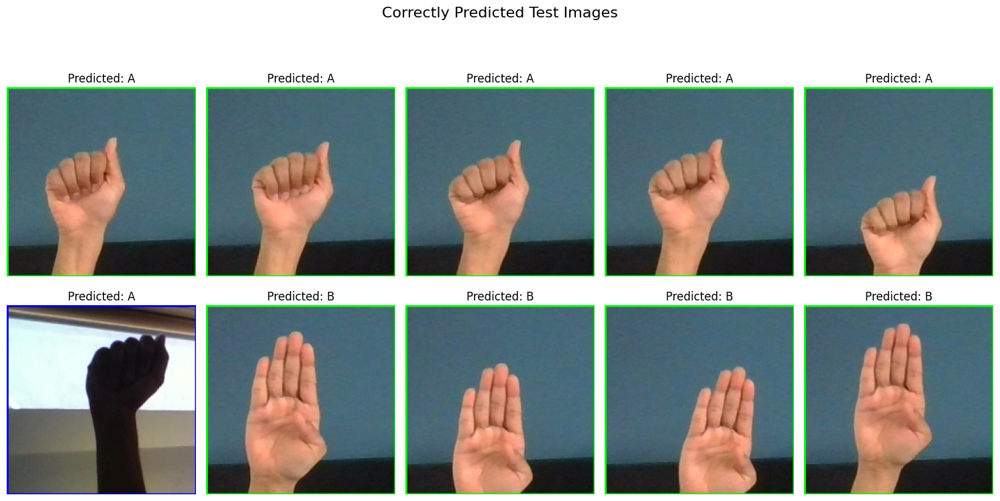

In [33]:
# Get class labels and predictions
class_labels = list(test_generator.class_indices.keys())
y_true = test_generator.classes
y_pred = np.argmax(predictions, axis=1)
filenames = test_generator.filenames

# Get correctly predicted indices
correct_indices = np.where(y_pred == y_true)[0]

# Plot a few correctly predicted test images
num_images = min(10, len(correct_indices))  # Display up to 10
plt.figure(figsize=(15, 8))

for i, idx in enumerate(correct_indices[:num_images]):
    img_path = os.path.join(test_generator.directory, filenames[idx])
    img = plt.imread(img_path)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {class_labels[y_pred[idx]]}")

plt.suptitle("Correctly Predicted Test Images", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


<span style="color:transparent;">ResNet50</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">ResNet50</h1>
</div>

<span style="color:transparent;">Configuration and Input Parameters</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Configuration and Input Parameters</h2>
</div>

In [7]:
# Reuse previous constants
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 16

<span style="color:transparent;">Dataset Paths</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Dataset Paths</h2>
</div>

In [8]:
train_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Train"   
test_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Test"

<span style="color:transparent;">Data Generators with Augmentation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Data Generators with Augmentation</h2>
</div>

In [9]:
# Data generators for ResNet50 (with ResNet-specific preprocessing)
train_val_datagen_resnet = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=15,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Train generator
train_generator_resnet = train_val_datagen_resnet.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

# Validation generator
val_generator_resnet = train_val_datagen_resnet.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)

Found 66962 images belonging to 27 classes.
Found 16740 images belonging to 27 classes.


In [11]:
# Test generator (no augmentation)
test_datagen_resnet = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator_resnet = test_datagen_resnet.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

# Class labels
class_names_resnet = list(train_generator_resnet.class_indices.keys())
num_classes_resnet = len(class_names_resnet)

print("Total classes:", num_classes_resnet)
print("Classes:", class_names_resnet)

Found 162 images belonging to 27 classes.
Total classes: 27
Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


<span style="color:transparent;">Save Class Indices</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Class Indices</h2>
</div>

In [ ]:
# Save class_indices for consistent use later
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_resnet.json", "w") as f:
    json.dump(train_generator_resnet.class_indices, f)

<span style="color:transparent;">Load Model Architecture</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Model Architecture</h2>
</div>

In [12]:
# Load ResNet50 base (without the top classification layer)
base_model_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Freeze the base model
base_model_resnet.trainable = False

# Add custom classification head
x = base_model_resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes_resnet, activation='softmax')(x)

# Final model
resnet_model = Model(inputs=base_model_resnet.input, outputs=predictions)

# Compile the model
resnet_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Summary
resnet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

<span style="color:transparent;">Set Callbacks</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Set Callbacks</h3>
</div>

In [42]:
# Callbacks
resnet_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

<span style="color:transparent;">Model Training</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Model Training</h3>
</div>

In [43]:
# Train the model
resnet_history = resnet_model.fit(
    train_generator_resnet,
    validation_data=val_generator_resnet,
    epochs=15,
    callbacks=resnet_callbacks
)

Epoch 1/15
4186/4186 [==============================] - ETA: 0s - loss: 0.9544 - accuracy: 0.7189
Epoch 1: val_accuracy improved from -inf to 0.77754, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\resnet50_best.h5
4186/4186 [==============================] - 2400s 573ms/step - loss: 0.9544 - accuracy: 0.7189 - val_loss: 0.7337 - val_accuracy: 0.7775
Epoch 2/15
4186/4186 [==============================] - ETA: 0s - loss: 0.3294 - accuracy: 0.8980
Epoch 2: val_accuracy improved from 0.77754 to 0.80394, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\resnet50_best.h5
4186/4186 [==============================] - 827s 198ms/step - loss: 0.3294 - accuracy: 0.8980 - val_loss: 0.6163 - val_accuracy: 0.8039
Epoch 3/15
4186/4186 [==============================] - ETA: 0s - loss: 0.2275 - accuracy: 0.9268
Epoch 3: val_accuracy improved from 0.80394 to 0.82115, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\resnet5

<span style="color:transparent;">Save Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_best.pkl", "wb") as f:
    pickle.dump(resnet_history.history, f)

<span style="color:transparent;">Load Saved Model</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Saved Model</h3>
</div>

In [ ]:
#Load the model
resnet_model = load_model("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_best.h5")

<span style="color:transparent;">Fine-Tuning</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Fine Tuning</h3>
</div>

In [ ]:
# Unfreeze the top convolutional blocks (e.g., conv5 and conv4)
for layer in resnet_model.layers:
    if 'conv5_block' in layer.name or 'conv4_block' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

# Recompile the model with a lower learning rate
resnet_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [15]:
# Updated callbacks for fine-tuning
fine_tune_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_finetuned_best_1.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

In [16]:
# Fine-tune the model
fine_tune_history_resnet = resnet_model.fit(
    train_generator_resnet,
    validation_data=val_generator_resnet,
    epochs=5,
    callbacks=fine_tune_callbacks
)

Epoch 1/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0907 - accuracy: 0.9706
Epoch 1: val_accuracy improved from -inf to 0.94223, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\resnet50_finetuned_best_1.h5
4186/4186 [==============================] - 3077s 732ms/step - loss: 0.0907 - accuracy: 0.9706 - val_loss: 0.1966 - val_accuracy: 0.9422
Epoch 2/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0196 - accuracy: 0.9938
Epoch 2: val_accuracy did not improve from 0.94223
4186/4186 [==============================] - 1384s 330ms/step - loss: 0.0196 - accuracy: 0.9938 - val_loss: 0.2608 - val_accuracy: 0.9420
Epoch 3/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0118 - accuracy: 0.9960
Epoch 3: val_accuracy improved from 0.94223 to 0.95818, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\resnet50_finetuned_best_1.h5
4186/4186 [==============================] - 1031s 246ms/step - l

<span style="color:transparent;">Save Fine-Tuned Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Fine-Tuned Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_finetuned_best_1.pkl", "wb") as f:
    pickle.dump(fine_tune_history_resnet.history, f)

<span style="color:transparent;">Plot Accuracy and Loss Curves</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Plot Accuracy and Loss Curves</h2>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_best.pkl", "rb") as f:
    history_1 = pickle.load(f)

with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_finetuned_best_1.pkl", "rb") as f:
    history_2 = pickle.load(f)


# Combine training and fine-tuning metrics
train_acc = history_1['accuracy'] + history_2['accuracy']
val_acc = history_1['val_accuracy'] + history_2['val_accuracy']
train_loss = history_1['loss'] + history_2['loss']
val_loss = history_1['val_loss'] + history_2['val_loss']

epochs = np.arange(1, len(train_acc) + 1)

# Plot configuration
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Model Loss", "Model Accuracy"]
)

# Loss curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ),
    row=1, col=1
)

# Accuracy curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ),
    row=1, col=2
)

#Fine-tuning start marker
first_finetune_start = len(history_1['accuracy']) + 1


#Fine-tuning vertical markers with spaced annotations
for ft_start, label, x_shift in zip(
    [first_finetune_start],
    ["Fine-tune #1"],
    [0.0, 0.8]  # Horizontal spacing for annotations
):
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=1)
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=2)
    fig.add_annotation(
        x=ft_start + x_shift,
        y=1.03,
        text=label,
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=-50,
        font=dict(size=12),
        row=1, col=2
    )

# --- Best validation accuracy annotation
best_epoch = np.argmax(val_acc) + 1
best_acc = val_acc[best_epoch - 1]

fig.add_annotation(
    x=best_epoch, y=best_acc,
    text=f"Best Val Acc: {best_acc:.2f}",
    showarrow=True, arrowhead=1, ax=0, ay=-40,
    row=1, col=2
)

# Axes
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Categorical Loss", linecolor="black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Accuracy", linecolor="black", ticks="outside", row=1, col=2)

# Layout
fig.update_layout(
    title="Training Loss and Metrics",
    title_x=0.5,
    width=950,
    height=420,
    plot_bgcolor="white",
    paper_bgcolor="white",
    showlegend=False
)

# Show plot
fig.show()


<span style="color:transparent;">Load Final Model for Evaluation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Final Model for Evaluation</h2>
</div>

In [ ]:
# Load your fine-tuned model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/resnet50_finetuned_best_1.h5"
fine_tuned_model_resnet = load_model(model_path)

<span style="color:transparent;">Confusion Matrix</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Confusion Matrix</h2>
</div>

In [ ]:
# Save class indices to ensure consistent label ordering
class_indices = train_generator_resnet.class_indices
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_resnet.json", "w") as f:
    json.dump(train_generator_resnet.class_indices, f)

# Reverse mapping: index → label
idx_to_label = {v: k for k, v in class_indices.items()}
labels = [idx_to_label[i] for i in range(len(idx_to_label))]

# Predict on test set
predictions = fine_tuned_model_resnet.predict(test_generator_resnet, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator_resnet.classes  # These are correct if shuffle=False

#Compute confusion matrix
conf_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=predicted_labels,
    num_classes=len(labels)
).numpy()

#Plot the confusion matrix using Plotly
fig = go.Figure(
    data=go.Heatmap(
        z=conf_matrix,
        x=labels,
        y=labels,
        text=conf_matrix,
        texttemplate="<b>%{text}</b>",
        textfont={"size": 8},
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,
        xgap=2,
        hovertemplate='Actual: %{y}<br>Predicted: %{x}<br>Total: %{text}<extra></extra>'
    )
)

fig.update_xaxes(
    title="<b>Predicted Values</b>",
    tickangle=0,
    tickfont_size=10,
    side='bottom'
)

fig.update_yaxes(
    title="<b>Actual Values</b>",
    tickfont_size=10
)

fig.update_layout(
    title_text='Confusion Matrix',
    title_x=0.5,
    font_size=14,
    width=1100,
    height=1000,
    plot_bgcolor='white',
    showlegend=False
)

fig.show()

162/162 [==============================] - 4s 12ms/step


<span style="color:transparent;">Evaluation Metrics</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Evaluation Metrics</h2>
</div>

#### Test Accuracy

In [24]:
loss, accuracy = fine_tuned_model_resnet.evaluate(test_generator_resnet)
print(f"Test Accuracy: {accuracy:.4f} | Test Loss: {loss:.4f}")

162/162 [==============================] - 3s 15ms/step - loss: 0.1439 - accuracy: 0.9630
Test Accuracy: 0.9630 | Test Loss: 0.1439


#### Classification Report

In [ ]:
# Get predictions and true labels
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator_resnet.classes
class_labels = list(test_generator_resnet.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)


              precision    recall  f1-score   support

           A       1.00      1.00      1.00         6
           B       1.00      1.00      1.00         6
           C       1.00      1.00      1.00         6
           D       1.00      1.00      1.00         6
           E       0.86      1.00      0.92         6
           F       1.00      1.00      1.00         6
           G       1.00      1.00      1.00         6
           H       1.00      1.00      1.00         6
           I       1.00      1.00      1.00         6
           J       1.00      1.00      1.00         6
           K       1.00      1.00      1.00         6
           L       1.00      1.00      1.00         6
           M       1.00      1.00      1.00         6
           N       1.00      1.00      1.00         6
     Nothing       1.00      0.17      0.29         6
           O       1.00      1.00      1.00         6
           P       1.00      1.00      1.00         6
           Q       1.00    

<span style="color:transparent;">Visualize Correct Predictions</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Visualize Correct Predictions</h2>
</div>

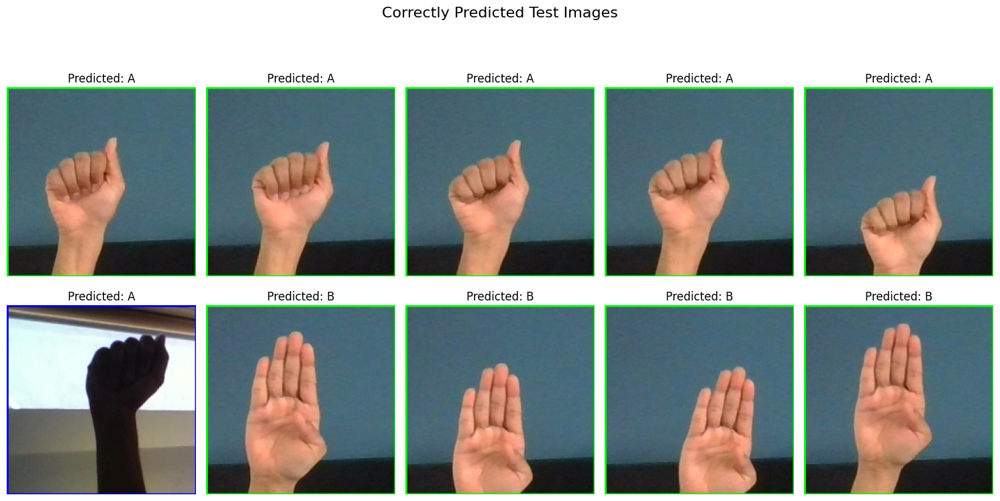

In [23]:
# Get class labels and predictions
class_labels = list(test_generator_resnet.class_indices.keys())
y_true = test_generator_resnet.classes
y_pred = np.argmax(predictions, axis=1)
filenames = test_generator_resnet.filenames

# Get correctly predicted indices
correct_indices = np.where(y_pred == y_true)[0]

# Plot a few correctly predicted test images
num_images = min(10, len(correct_indices))  # Display up to 10
plt.figure(figsize=(15, 8))

for i, idx in enumerate(correct_indices[:num_images]):
    img_path = os.path.join(test_generator_resnet.directory, filenames[idx])
    img = plt.imread(img_path)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {class_labels[y_pred[idx]]}")

plt.suptitle("Correctly Predicted Test Images", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


<span style="color:transparent;">DenseNet201</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">DenseNet201</h1>
</div>

<span style="color:transparent;">Configuration and Input Parameters</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Configuration and Input Parameters</h2>
</div>

In [2]:
# Set image parameters
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 16

<span style="color:transparent;">Dataset Paths</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Dataset Paths</h2>
</div>

In [3]:
train_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Train"   
test_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Test" 

<span style="color:transparent;">Data Generators with Augmentation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Data Generators with Augmentation</h2>
</div>

In [4]:
train_val_datagen_densenet = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=10,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator_densenet = train_val_datagen_densenet.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_generator_densenet = train_val_datagen_densenet.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)


Found 66962 images belonging to 27 classes.
Found 16740 images belonging to 27 classes.


In [8]:
test_datagen_densenet = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator_densenet = test_datagen_densenet.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

class_names_densenet = list(train_generator_densenet.class_indices.keys())
num_classes_densenet = len(class_names_densenet)
print("Total classes:", num_classes_densenet)
print("Classes:", class_names_densenet)

Found 162 images belonging to 27 classes.
Total classes: 27
Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


<span style="color:transparent;">Save Class Indices</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Class Indices</h2>
</div>

In [ ]:
# Save class_indices for consistent use later
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_densenet.json", "w") as f:
    json.dump(train_generator_densenet.class_indices, f)


<span style="color:transparent;">Load Model Architecture</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Model Architecture</h2>
</div>

In [9]:
# Load DenseNet201 base (without top)
base_model_densenet = DenseNet201(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
base_model_densenet.trainable = False  # Freeze base

# Custom classification head
x = base_model_densenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes_densenet, activation='softmax')(x)

# Final model
densenet_model = Model(inputs=base_model_densenet.input, outputs=predictions)

# Compile
densenet_model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
densenet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

<span style="color:transparent;">Set Callbacks</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Set Callbacks</h3>
</div>

In [10]:
densenet_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

<span style="color:transparent;">Model Training</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Model Training</h3>
</div>

In [11]:
# Train the model
densenet_history = densenet_model.fit(
    train_generator_densenet,
    validation_data=val_generator_densenet,
    epochs=15,
    callbacks=densenet_callbacks
)

Epoch 1/15
4186/4186 [==============================] - ETA: 0s - loss: 0.9725 - accuracy: 0.7303
Epoch 1: val_accuracy improved from -inf to 0.83441, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\densenet201_best.h5
4186/4186 [==============================] - 2676s 636ms/step - loss: 0.9725 - accuracy: 0.7303 - val_loss: 0.6286 - val_accuracy: 0.8344
Epoch 2/15
4186/4186 [==============================] - ETA: 0s - loss: 0.3018 - accuracy: 0.9135
Epoch 2: val_accuracy improved from 0.83441 to 0.85508, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\densenet201_best.h5
4186/4186 [==============================] - 929s 222ms/step - loss: 0.3018 - accuracy: 0.9135 - val_loss: 0.4980 - val_accuracy: 0.8551
Epoch 3/15
4186/4186 [==============================] - ETA: 0s - loss: 0.1975 - accuracy: 0.9418
Epoch 3: val_accuracy improved from 0.85508 to 0.87401, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\d

<span style="color:transparent;">Save Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Model History</h3>
</div>

In [ ]:
# Save history to disk
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_history.pkl", 'wb') as f:
    pickle.dump(densenet_history.history, f)


<span style="color:transparent;">Load Saved Model</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Saved Model</h3>
</div>

In [14]:
# Load best model after initial training
model = load_model("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_best.h5")

<span style="color:transparent;">Fine-Tuning</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Fine Tuning</h3>
</div>

In [15]:
# Unfreeze the base model
for layer in model.layers:
    if 'conv5_block' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

# Recompile with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [16]:
# Set callbacks
fine_tune_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_finetuned_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]


In [17]:
# Fine-tune the model
fine_tune_history_densenet = model.fit(
    train_generator_densenet,
    validation_data=val_generator_densenet,
    epochs=5, 
    callbacks=fine_tune_callbacks
)


Epoch 1/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0672 - accuracy: 0.9780
Epoch 1: val_accuracy improved from -inf to 0.91995, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\densenet201_finetuned_best.h5
4186/4186 [==============================] - 1829s 433ms/step - loss: 0.0672 - accuracy: 0.9780 - val_loss: 0.3004 - val_accuracy: 0.9200
Epoch 2/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0241 - accuracy: 0.9923
Epoch 2: val_accuracy improved from 0.91995 to 0.93608, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\densenet201_finetuned_best.h5
4186/4186 [==============================] - 1136s 271ms/step - loss: 0.0241 - accuracy: 0.9923 - val_loss: 0.2136 - val_accuracy: 0.9361
Epoch 3/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0159 - accuracy: 0.9946
Epoch 3: val_accuracy did not improve from 0.93608
4186/4186 [==============================] - 1144s 273ms/step -

<span style="color:transparent;">Save Fine-Tuned Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Fine-Tuned Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_finetune_history.pkl", "wb") as f:
    pickle.dump(fine_tune_history_densenet.history, f)


<span style="color:transparent;">Plot Accuracy and Loss Curves</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Plot Accuracy and Loss Curves</h2>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_history.pkl", "rb") as f:
    history_1 = pickle.load(f)

with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_finetune_history.pkl", "rb") as f:
    history_2 = pickle.load(f)


# Combine training and fine-tuning metrics
train_acc = history_1['accuracy'] + history_2['accuracy']
val_acc = history_1['val_accuracy'] + history_2['val_accuracy']
train_loss = history_1['loss'] + history_2['loss']
val_loss = history_1['val_loss'] + history_2['val_loss']

epochs = np.arange(1, len(train_acc) + 1)

# Plot configuration
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Model Loss", "Model Accuracy"]
)

# Loss curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ),
    row=1, col=1
)

# Accuracy curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ),
    row=1, col=2
)

#Fine-tuning start marker
first_finetune_start = len(history_1['accuracy']) + 1


#Fine-tuning vertical markers with spaced annotations
for ft_start, label, x_shift in zip(
    [first_finetune_start],
    ["Fine-tune #1"],
    [0.0, 0.8]  # Horizontal spacing for annotations
):
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=1)
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=2)
    fig.add_annotation(
        x=ft_start + x_shift,
        y=1.03,
        text=label,
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=-50,
        font=dict(size=12),
        row=1, col=2
    )

#Best validation accuracy annotation
best_epoch = np.argmax(val_acc) + 1
best_acc = val_acc[best_epoch - 1]

fig.add_annotation(
    x=best_epoch, y=best_acc,
    text=f"Best Val Acc: {best_acc:.2f}",
    showarrow=True, arrowhead=1, ax=0, ay=-40,
    row=1, col=2
)

# Axes
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Categorical Loss", linecolor="black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Accuracy", linecolor="black", ticks="outside", row=1, col=2)

# Layout
fig.update_layout(
    title="Training Loss and Metrics",
    title_x=0.5,
    width=950,
    height=420,
    plot_bgcolor="white",
    paper_bgcolor="white",
    showlegend=False
)

# Show plot
fig.show()


<span style="color:transparent;">Load Final Model for Evaluation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Final Model for Evaluation</h2>
</div>

In [ ]:
# Load your fine-tuned model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/densenet201_finetuned_best.h5"
fine_tuned_model_densenet = load_model(model_path)

<span style="color:transparent;">Confusion Matrix</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Confusion Matrix</h2>
</div>


In [ ]:
# Save class indices to ensure consistent label ordering
class_indices = train_generator_densenet.class_indices
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_densenet.json", "w") as f:
    json.dump(train_generator_densenet.class_indices, f)

# Reverse mapping: index → label
idx_to_label = {v: k for k, v in class_indices.items()}
labels = [idx_to_label[i] for i in range(len(idx_to_label))]

# Predict on test set
predictions = fine_tuned_model_densenet.predict(test_generator_densenet, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator_densenet.classes

#Compute confusion matrix
conf_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=predicted_labels,
    num_classes=len(labels)
).numpy()

#Plot the confusion matrix using Plotly
fig = go.Figure(
    data=go.Heatmap(
        z=conf_matrix,
        x=labels,
        y=labels,
        text=conf_matrix,
        texttemplate="<b>%{text}</b>",
        textfont={"size": 8},
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,
        xgap=2,
        hovertemplate='Actual: %{y}<br>Predicted: %{x}<br>Total: %{text}<extra></extra>'
    )
)

fig.update_xaxes(
    title="<b>Predicted Values</b>",
    tickangle=0,
    tickfont_size=10,
    side='bottom'
)

fig.update_yaxes(
    title="<b>Actual Values</b>",
    tickfont_size=10
)

fig.update_layout(
    title_text='Confusion Matrix',
    title_x=0.5,
    font_size=14,
    width=1100,
    height=1000,
    plot_bgcolor='white',
    showlegend=False
)

fig.show()

162/162 [==============================] - 10s 42ms/step


<span style="color:transparent;">Evaluation Metrics</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Evaluation Metrics</h2>
</div>


#### Test Accuracy

In [26]:
loss, accuracy = fine_tuned_model_densenet.evaluate(test_generator_densenet)
print(f"Test Accuracy: {accuracy:.4f} | Test Loss: {loss:.4f}")

162/162 [==============================] - 9s 38ms/step - loss: 0.0500 - accuracy: 0.9938
Test Accuracy: 0.9938 | Test Loss: 0.0500


#### Classification Report

In [ ]:
# Get predictions and true labels
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator_densenet.classes
class_labels = list(test_generator_densenet.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)


              precision    recall  f1-score   support

           A       1.00      1.00      1.00         6
           B       1.00      1.00      1.00         6
           C       1.00      1.00      1.00         6
           D       1.00      1.00      1.00         6
           E       1.00      1.00      1.00         6
           F       1.00      1.00      1.00         6
           G       1.00      1.00      1.00         6
           H       1.00      1.00      1.00         6
           I       1.00      1.00      1.00         6
           J       1.00      1.00      1.00         6
           K       1.00      1.00      1.00         6
           L       1.00      1.00      1.00         6
           M       1.00      0.83      0.91         6
           N       0.86      1.00      0.92         6
     Nothing       1.00      1.00      1.00         6
           O       1.00      1.00      1.00         6
           P       1.00      1.00      1.00         6
           Q       1.00    

<span style="color:transparent;">Visualize Correct Predictions</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Visualize Correct Predictions</h2>
</div>

162/162 [==============================] - 6s 37ms/step


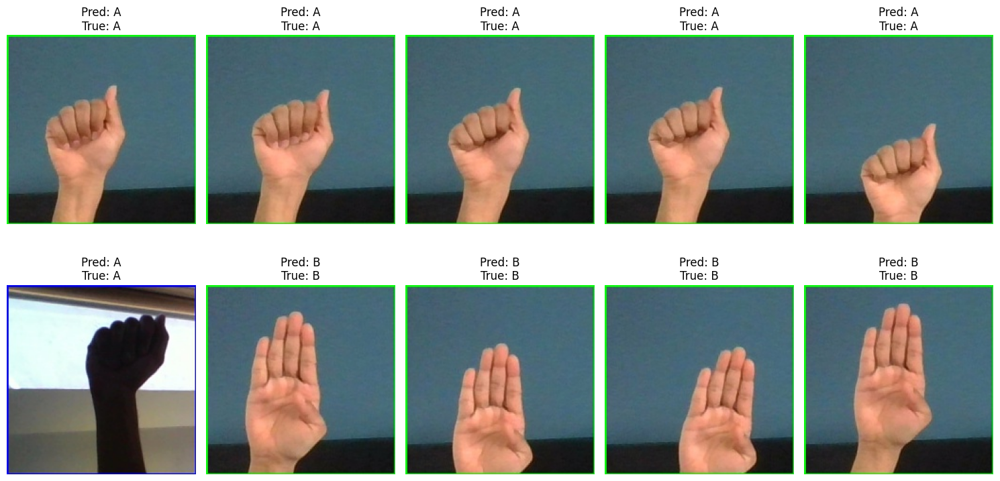

In [28]:
# Get predictions
pred_probs = fine_tuned_model_densenet.predict(test_generator_densenet)
pred_classes = np.argmax(pred_probs, axis=1)

# True labels
true_classes = test_generator_densenet.classes
class_labels = list(test_generator_densenet.class_indices.keys())

# Filenames for images
filenames = test_generator_densenet.filenames

# Find correct predictions
correct_indices = np.where(pred_classes == true_classes)[0]

# Display first N correct predictions
N = 10  # Change this to see more/less images
plt.figure(figsize=(15, 8))
for i, idx in enumerate(correct_indices[:N]):
    img_path = os.path.join(test_generator_densenet.directory, filenames[idx])
    img = plt.imread(img_path)

    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Pred: {class_labels[pred_classes[idx]]}\nTrue: {class_labels[true_classes[idx]]}")
plt.tight_layout()
plt.show()

<span style="color:transparent;">InceptionV3</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">InceptionV3</h1>
</div>

<span style="color:transparent;">Configuration and Input Parameters</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Configuration and Input Parameters</h2>
</div>

In [ ]:
# Constants
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 16

<span style="color:transparent;">Dataset Paths</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Dataset Paths</h2>
</div>

In [3]:
train_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Train"   
test_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Test" 

<span style="color:transparent;">Data Generators with Augmentation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Data Generators with Augmentation</h2>
</div>

In [4]:
train_val_datagen_inception = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.2,
    rotation_range=10,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator_inception = train_val_datagen_inception.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_generator_inception = train_val_datagen_inception.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)

Found 66962 images belonging to 27 classes.
Found 16740 images belonging to 27 classes.


In [6]:
test_datagen_inception = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator_inception = test_datagen_inception.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

class_names_inception = list(train_generator_inception.class_indices.keys())
num_classes_inception = len(class_names_inception)

print("Total classes:", num_classes_inception)
print("Classes:", class_names_inception)

Found 162 images belonging to 27 classes.
Total classes: 27
Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


<span style="color:transparent;">Save Class Indices</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Class Indices</h2>
</div>

In [ ]:
# Save class_indices for consistent use later
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_inception.json", "w") as f:
    json.dump(train_generator_inception.class_indices, f)


<span style="color:transparent;">Load Model Architecture</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Model Architecture</h2>
</div>

In [7]:
# Load InceptionV3 base
base_model_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))
base_model_inception.trainable = False  # Freeze base

# Custom head
x = base_model_inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes_inception, activation='softmax')(x)

# Final model
inception_model = Model(inputs=base_model_inception.input, outputs=predictions)

# Compile
inception_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inception_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

<span style="color:transparent;">Set Callbacks</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Set Callbacks</h3>
</div>

In [8]:
inception_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

<span style="color:transparent;">Model Training</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Model Training</h3>
</div>

In [9]:
# Train the model
inception_history = inception_model.fit(
    train_generator_inception,
    validation_data=val_generator_inception,
    epochs=15,
    callbacks=inception_callbacks
)

Epoch 1/15
4186/4186 [==============================] - ETA: 0s - loss: 1.2851 - accuracy: 0.6225
Epoch 1: val_accuracy improved from -inf to 0.63967, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\inceptionv3_best.h5
4186/4186 [==============================] - 2746s 654ms/step - loss: 1.2851 - accuracy: 0.6225 - val_loss: 1.2246 - val_accuracy: 0.6397
Epoch 2/15
4186/4186 [==============================] - ETA: 0s - loss: 0.6339 - accuracy: 0.8001
Epoch 2: val_accuracy improved from 0.63967 to 0.69020, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\inceptionv3_best.h5
4186/4186 [==============================] - 873s 209ms/step - loss: 0.6339 - accuracy: 0.8001 - val_loss: 1.0121 - val_accuracy: 0.6902
Epoch 3/15
4186/4186 [==============================] - ETA: 0s - loss: 0.4978 - accuracy: 0.8430
Epoch 3: val_accuracy improved from 0.69020 to 0.72198, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\i

<span style="color:transparent;">Save Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Model History</h3>
</div>

In [ ]:
# Save the history object
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_history.pkl", "wb") as f:
    pickle.dump(inception_history.history, f)


<span style="color:transparent;">Load Saved Model</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Saved Model</h3>
</div>

In [ ]:
# Load best model from initial training
inception_model = load_model("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_best.h5")

<span style="color:transparent;">Fine-Tuning</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Fine Tuning</h3>
</div>

In [16]:
# Unfreeze from 'mixed7' layer onward (recommended for InceptionV3)
set_trainable = False
for layer in inception_model.layers:
    if layer.name == 'mixed7':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

# Recompile with a very low learning rate
inception_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [17]:
# Define fine-tuning callbacks
fine_tune_callbacks_inception = [
    EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_finetuned_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

In [18]:
# Fine-tune
fine_tune_history_inception = inception_model.fit(
    train_generator_inception,
    validation_data=val_generator_inception,
    epochs=5,
    callbacks=fine_tune_callbacks_inception
)


Epoch 1/5
4186/4186 [==============================] - ETA: 0s - loss: 0.2885 - accuracy: 0.9075
Epoch 1: val_accuracy improved from -inf to 0.84737, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\inceptionv3_finetuned_best.h5
4186/4186 [==============================] - 1490s 355ms/step - loss: 0.2885 - accuracy: 0.9075 - val_loss: 0.5725 - val_accuracy: 0.8474
Epoch 2/5
4186/4186 [==============================] - ETA: 0s - loss: 0.1082 - accuracy: 0.9657
Epoch 2: val_accuracy improved from 0.84737 to 0.86559, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\inceptionv3_finetuned_best.h5
4186/4186 [==============================] - 1622s 387ms/step - loss: 0.1082 - accuracy: 0.9657 - val_loss: 0.5121 - val_accuracy: 0.8656
Epoch 3/5
4186/4186 [==============================] - ETA: 0s - loss: 0.0691 - accuracy: 0.9783
Epoch 3: val_accuracy improved from 0.86559 to 0.87826, saving model to D:/Data/Study/Research Practicum/Project/.

<span style="color:transparent;">Save Fine-Tuned Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Fine-Tuned Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_finetune_history.pkl", "wb") as f:
    pickle.dump(fine_tune_history_inception.history, f)


<span style="color:transparent;">Plot Accuracy and Loss Curves</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Plot Accuracy and Loss Curves</h2>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_history.pkl", "rb") as f:
    history_1 = pickle.load(f)

with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_finetune_history.pkl", "rb") as f:
    history_2 = pickle.load(f)


# Combine training and fine-tuning metrics
train_acc = history_1['accuracy'] + history_2['accuracy']
val_acc = history_1['val_accuracy'] + history_2['val_accuracy']
train_loss = history_1['loss'] + history_2['loss']
val_loss = history_1['val_loss'] + history_2['val_loss']

epochs = np.arange(1, len(train_acc) + 1)

# Plot configuration
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Model Loss", "Model Accuracy"]
)

# Loss curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ),
    row=1, col=1
)

# Accuracy curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ),
    row=1, col=2
)

#Fine-tuning start marker
first_finetune_start = len(history_1['accuracy']) + 1


#Fine-tuning vertical markers with spaced annotations
for ft_start, label, x_shift in zip(
    [first_finetune_start],
    ["Fine-tune #1"],
    [0.0, 0.8]  # Horizontal spacing for annotations
):
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=1)
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=2)
    fig.add_annotation(
        x=ft_start + x_shift,
        y=1.03,
        text=label,
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=-50,
        font=dict(size=12),
        row=1, col=2
    )

#Best validation accuracy annotation
best_epoch = np.argmax(val_acc) + 1
best_acc = val_acc[best_epoch - 1]

fig.add_annotation(
    x=best_epoch, y=best_acc,
    text=f"Best Val Acc: {best_acc:.2f}",
    showarrow=True, arrowhead=1, ax=0, ay=-40,
    row=1, col=2
)

# Axes
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Categorical Loss", linecolor="black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Accuracy", linecolor="black", ticks="outside", row=1, col=2)

# Layout
fig.update_layout(
    title="Training Loss and Metrics",
    title_x=0.5,
    width=950,
    height=420,
    plot_bgcolor="white",
    paper_bgcolor="white",
    showlegend=False
)

# Show plot
fig.show()


<span style="color:transparent;">Load Final Model for Evaluation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Final Model for Evaluation</h2>
</div>

In [ ]:
#Load fine-tuned model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/inceptionv3_finetuned_best.h5"
fine_tuned_model_inception = load_model(model_path)

<span style="color:transparent;">Confusion Matrix</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Confusion Matrix</h2>
</div>

In [ ]:
# Save class indices to ensure consistent label ordering
class_indices = train_generator_inception.class_indices
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_inception.json", "w") as f:
    json.dump(train_generator_inception.class_indices, f)

# Reverse mapping: index → label
idx_to_label = {v: k for k, v in class_indices.items()}
labels = [idx_to_label[i] for i in range(len(idx_to_label))]

# Predict on test set
predictions = fine_tuned_model_inception.predict(test_generator_inception, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator_inception.classes 

#Compute confusion matrix
conf_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=predicted_labels,
    num_classes=len(labels)
).numpy()

#Plot the confusion matrix using Plotly
fig = go.Figure(
    data=go.Heatmap(
        z=conf_matrix,
        x=labels,
        y=labels,
        text=conf_matrix,
        texttemplate="<b>%{text}</b>",
        textfont={"size": 8},
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,
        xgap=2,
        hovertemplate='Actual: %{y}<br>Predicted: %{x}<br>Total: %{text}<extra></extra>'
    )
)

fig.update_xaxes(
    title="<b>Predicted Values</b>",
    tickangle=0,
    tickfont_size=10,
    side='bottom'
)

fig.update_yaxes(
    title="<b>Actual Values</b>",
    tickfont_size=10
)

fig.update_layout(
    title_text='Confusion Matrix',
    title_x=0.5,
    font_size=14,
    width=1100,
    height=1000,
    plot_bgcolor='white',
    showlegend=False
)

fig.show()

162/162 [==============================] - 4s 17ms/step


<span style="color:transparent;">Evaluation Metrics</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Evaluation Metrics</h2>
</div>


#### Test Accuracy

In [24]:
loss, accuracy = fine_tuned_model_inception.evaluate(test_generator_inception)
print(f"Test Accuracy: {accuracy:.4f} | Test Loss: {loss:.4f}")

162/162 [==============================] - 6s 24ms/step - loss: 0.1078 - accuracy: 0.9630
Test Accuracy: 0.9630 | Test Loss: 0.1078


#### Classification Report

In [ ]:
# Get predictions and true labels
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator_inception.classes
class_labels = list(test_generator_inception.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)

              precision    recall  f1-score   support

           A       1.00      1.00      1.00         6
           B       1.00      1.00      1.00         6
           C       1.00      1.00      1.00         6
           D       1.00      1.00      1.00         6
           E       1.00      1.00      1.00         6
           F       1.00      1.00      1.00         6
           G       1.00      0.67      0.80         6
           H       0.71      0.83      0.77         6
           I       1.00      1.00      1.00         6
           J       0.86      1.00      0.92         6
           K       0.86      1.00      0.92         6
           L       1.00      1.00      1.00         6
           M       0.86      1.00      0.92         6
           N       1.00      0.83      0.91         6
     Nothing       1.00      1.00      1.00         6
           O       1.00      1.00      1.00         6
           P       1.00      1.00      1.00         6
           Q       1.00    

<span style="color:transparent;">Visualize Correct Predictions</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Visualize Correct Predictions</h2>
</div>

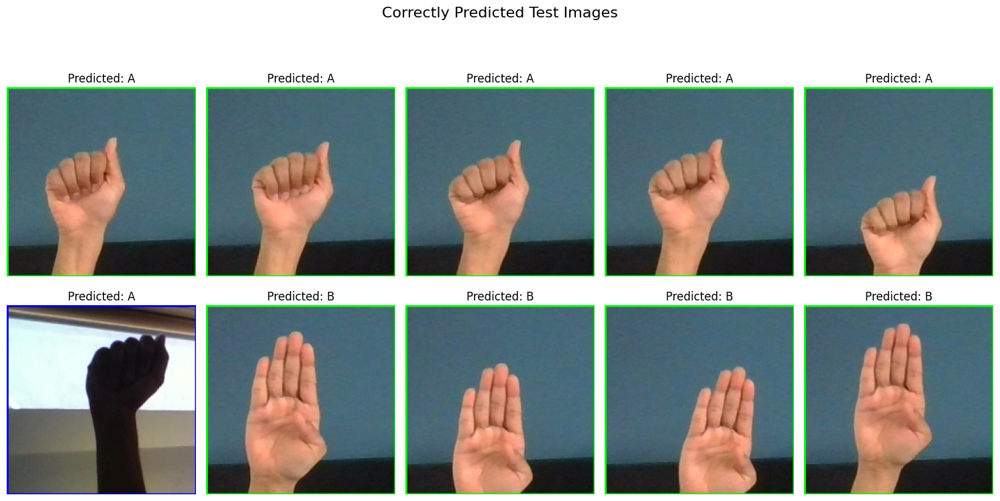

In [26]:
# Get class labels and predictions
class_labels = list(test_generator_inception.class_indices.keys())
y_true = test_generator_inception.classes
y_pred = np.argmax(predictions, axis=1)
filenames = test_generator_inception.filenames

# Get correctly predicted indices
correct_indices = np.where(y_pred == y_true)[0]

# Plot a few correctly predicted test images
num_images = min(10, len(correct_indices))  # Display up to 10
plt.figure(figsize=(15, 8))

for i, idx in enumerate(correct_indices[:num_images]):
    img_path = os.path.join(test_generator_inception.directory, filenames[idx])
    img = plt.imread(img_path)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {class_labels[y_pred[idx]]}")

plt.suptitle("Correctly Predicted Test Images", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


<span style="color:transparent;">Custom CNN</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Custom CNN</h1>
</div>

<span style="color:transparent;">Configuration and Input Parameters</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Configuration and Input Parameters</h2>
</div>

In [4]:
IMG_HEIGHT = 160
IMG_WIDTH = 160
BATCH_SIZE = 16

<span style="color:transparent;">Dataset Paths</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Dataset Paths</h2>
</div>

In [5]:
train_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Train"   
test_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Test"

<span style="color:transparent;">Data Generators with Augmentation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Data Generators with Augmentation</h2>
</div>

In [6]:
train_datagen_cnn = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    shear_range=0.1,
    brightness_range=(0.85, 1.15),
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)

train_generator_cnn = train_datagen_cnn.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_generator_cnn = train_datagen_cnn.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)



Found 66962 images belonging to 27 classes.
Found 16740 images belonging to 27 classes.


In [8]:
test_datagen_cnn = ImageDataGenerator(rescale=1./255)

test_generator_cnn = test_datagen_cnn.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

class_names_cnn = list(train_generator_cnn.class_indices.keys())
num_classes_cnn = len(class_names_cnn)

print("Total classes:", num_classes_cnn)
print("Classes:", class_names_cnn)

Found 162 images belonging to 27 classes.
Total classes: 27
Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


<span style="color:transparent;">Save Class Indices</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Class Indices</h2>
</div>

In [ ]:
# Save class_indices for consistent use later
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_cnn_v6.json", "w") as f:
    json.dump(train_generator_cnn.class_indices, f)


<span style="color:transparent;">Load Model Architecture</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Model Architecture</h2>
</div>

In [9]:
cnn_model_v6 = Sequential([
    # Block 1
    Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),

    # Block 2
    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    # Block 3
    Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.3),

    # Head
    GlobalAveragePooling2D(),
    Dense(512, activation='relu', kernel_regularizer=l2(1e-4)),
    Dropout(0.4),
    Dense(train_generator_cnn.num_classes, activation='softmax')
])


cnn_model_v6.compile(
    optimizer=Adam(learning_rate=5e-5),
    loss=CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

cnn_model_v6.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 160, 160, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 160, 160, 64)      36928     
                                                                 
 batch_normalization_1 (Batc  (None, 160, 160, 64)     256       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 64)       0         
 )                                                               
                                                        

<span style="color:transparent;">Set Callbacks</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Set Callbacks</h3>
</div>

In [10]:
cnn_callbacks_v6 = [
    EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, min_lr=1e-6),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/custom_cnn_v6_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

<span style="color:transparent;">Model Training</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Model Training</h3>
</div>

In [11]:
cnn_history_v6 = cnn_model_v6.fit(
    train_generator_cnn,
    validation_data=val_generator_cnn,
    epochs=15,
    callbacks=cnn_callbacks_v6
)

Epoch 1/15
4186/4186 [==============================] - ETA: 0s - loss: 2.4350 - accuracy: 0.3753
Epoch 1: val_accuracy improved from -inf to 0.46655, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\custom_cnn_v6_best.h5
4186/4186 [==============================] - 1805s 428ms/step - loss: 2.4350 - accuracy: 0.3753 - val_loss: 2.2152 - val_accuracy: 0.4665 - lr: 5.0000e-05
Epoch 2/15
4186/4186 [==============================] - ETA: 0s - loss: 1.5711 - accuracy: 0.7205
Epoch 2: val_accuracy improved from 0.46655 to 0.61171, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\custom_cnn_v6_best.h5
4186/4186 [==============================] - 1486s 355ms/step - loss: 1.5711 - accuracy: 0.7205 - val_loss: 1.8019 - val_accuracy: 0.6117 - lr: 5.0000e-05
Epoch 3/15
4186/4186 [==============================] - ETA: 0s - loss: 1.2164 - accuracy: 0.8756
Epoch 3: val_accuracy improved from 0.61171 to 0.73226, saving model to D:/Data/Study/Researc

<span style="color:transparent;">Save Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Model History</h3>
</div>

In [ ]:
# Save the history object
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/custom_cnn_v6_best_history.pkl", "wb") as f:
    pickle.dump(cnn_history_v6.history, f)

<span style="color:transparent;">Plot Accuracy and Loss Curves</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Plot Accuracy and Loss Curves</h2>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/custom_cnn_v6_best_history.pkl", "rb") as f:
    history_1 = pickle.load(f)

# Combine training and fine-tuning metrics
train_acc = history_1['accuracy'] 
val_acc = history_1['val_accuracy']
train_loss = history_1['loss']
val_loss = history_1['val_loss']

epochs = np.arange(1, len(train_acc) + 1)

# Plot configuration
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Model Loss", "Model Accuracy"]
)

# Loss curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_loss,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ),
    row=1, col=1
)

# Accuracy curves
fig.add_trace(
    go.Scatter(
        x=epochs, y=train_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ),
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=epochs, y=val_acc,
        mode="lines+markers",
        marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ),
    row=1, col=2
)

#Best validation accuracy annotation
best_epoch = np.argmax(val_acc) + 1
best_acc = val_acc[best_epoch - 1]

fig.add_annotation(
    x=best_epoch, y=best_acc,
    text=f"Best Val Acc: {best_acc:.2f}",
    showarrow=True, arrowhead=1, ax=0, ay=-40,
    row=1, col=2
)

# Axes
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Categorical Loss", linecolor="black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Accuracy", linecolor="black", ticks="outside", row=1, col=2)

# Layout
fig.update_layout(
    title="Training Loss and Metrics",
    title_x=0.5,
    width=950,
    height=420,
    plot_bgcolor="white",
    paper_bgcolor="white",
    showlegend=False
)

# Show plot
fig.show()


<span style="color:transparent;">Load Final Model for Evaluation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Final Model for Evaluation</h2>
</div>

In [ ]:
#Load model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/custom_cnn_v6_best.h5"
model_cnn = load_model(model_path)

<span style="color:transparent;">Confusion Matrix</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Confusion Matrix</h2>
</div>


In [ ]:
# Save class indices to ensure consistent label ordering
class_indices = train_generator_cnn.class_indices
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_cnn.json", "w") as f:
    json.dump(train_generator_cnn.class_indices, f)

# Reverse mapping: index → label
idx_to_label = {v: k for k, v in class_indices.items()}
labels = [idx_to_label[i] for i in range(len(idx_to_label))]

# Predict on test set
predictions = model_cnn.predict(test_generator_cnn, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_generator_cnn.classes

#Compute confusion matrix
conf_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=predicted_labels,
    num_classes=len(labels)
).numpy()

#Plot the confusion matrix using Plotly
fig = go.Figure(
    data=go.Heatmap(
        z=conf_matrix,
        x=labels,
        y=labels,
        text=conf_matrix,
        texttemplate="<b>%{text}</b>",
        textfont={"size": 8},
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,
        xgap=2,
        hovertemplate='Actual: %{y}<br>Predicted: %{x}<br>Total: %{text}<extra></extra>'
    )
)

fig.update_xaxes(
    title="<b>Predicted Values</b>",
    tickangle=0,
    tickfont_size=10,
    side='bottom'
)

fig.update_yaxes(
    title="<b>Actual Values</b>",
    tickfont_size=10
)

fig.update_layout(
    title_text='Confusion Matrix',
    title_x=0.5,
    font_size=14,
    width=1100,
    height=1000,
    plot_bgcolor='white',
    showlegend=False
)

fig.show()

162/162 [==============================] - 4s 6ms/step


<span style="color:transparent;">Evaluation Metrics</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Evaluation Metrics</h2>
</div>

#### Test Accuracy

In [17]:
loss, accuracy = model_cnn.evaluate(test_generator_cnn)
print(f"Test Accuracy: {accuracy:.4f} | Test Loss: {loss:.4f}")

162/162 [==============================] - 2s 6ms/step - loss: 1.0299 - accuracy: 0.8889
Test Accuracy: 0.8889 | Test Loss: 1.0299


#### Classification Report


In [ ]:
# Get predictions and true labels
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator_cnn.classes
class_labels = list(test_generator_cnn.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)

              precision    recall  f1-score   support

           A       1.00      0.17      0.29         6
           B       1.00      0.50      0.67         6
           C       1.00      1.00      1.00         6
           D       1.00      1.00      1.00         6
           E       1.00      1.00      1.00         6
           F       1.00      1.00      1.00         6
           G       1.00      1.00      1.00         6
           H       1.00      1.00      1.00         6
           I       0.75      1.00      0.86         6
           J       1.00      1.00      1.00         6
           K       1.00      1.00      1.00         6
           L       1.00      1.00      1.00         6
           M       0.67      1.00      0.80         6
           N       1.00      0.50      0.67         6
     Nothing       1.00      1.00      1.00         6
           O       1.00      1.00      1.00         6
           P       0.86      1.00      0.92         6
           Q       1.00    

<span style="color:transparent;">Visualize Correct Predictions</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Visualize Correct Predictions</h2>
</div>


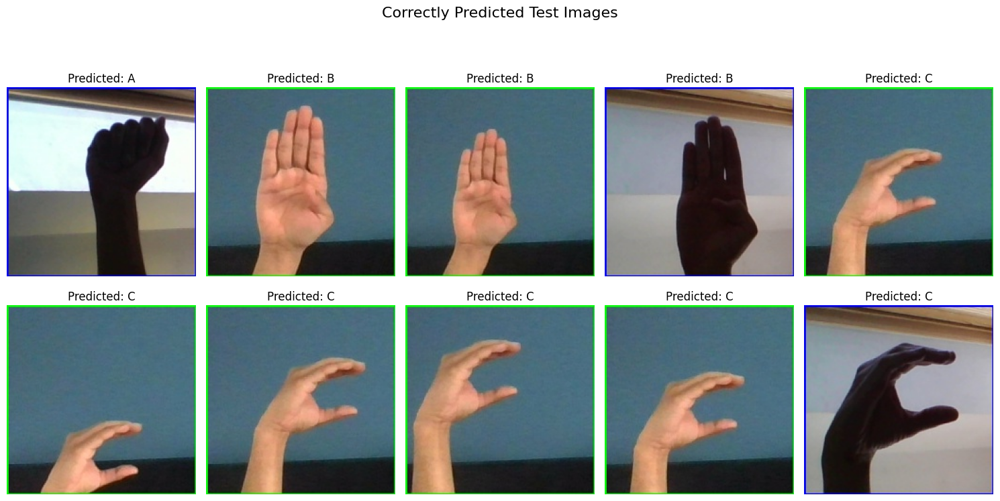

In [19]:
# Get class labels and predictions
class_labels = list(test_generator_cnn.class_indices.keys())
y_true = test_generator_cnn.classes
y_pred = np.argmax(predictions, axis=1)
filenames = test_generator_cnn.filenames

# Get correctly predicted indices
correct_indices = np.where(y_pred == y_true)[0]

# Plot a few correctly predicted test images
num_images = min(10, len(correct_indices))  # Display up to 10
plt.figure(figsize=(15, 8))

for i, idx in enumerate(correct_indices[:num_images]):
    img_path = os.path.join(test_generator_cnn.directory, filenames[idx])
    img = plt.imread(img_path)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {class_labels[y_pred[idx]]}")

plt.suptitle("Correctly Predicted Test Images", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


<span style="color:transparent;">MobileNetV2</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">MobileNetV2</h1>
</div>

<span style="color:transparent;">Configuration and Input Parameters</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Configuration and Input Parameters</h2>
</div>


In [4]:
# Define input shape and base model
IMG_HEIGHT = 160
IMG_WIDTH = 160
BATCH_SIZE = 16

<span style="color:transparent;">Dataset Paths</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Dataset Paths</h2>
</div>

In [5]:
train_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Train"   
test_dir = "D:/Data/Study/Research Practicum/Project/.venv/New_ASL/Test"

<span style="color:transparent;">Data Generators with Augmentation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Data Generators with Augmentation</h2>
</div>

In [ ]:
train_val_datagen_mobilenet = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=10,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=(0.85, 1.15),
    horizontal_flip=True,
    fill_mode='nearest'
)

# Training Generator
train_generator_mobilenet = train_val_datagen_mobilenet.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

# Validation Generator
val_generator_mobilenet = train_val_datagen_mobilenet.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
)

Found 66962 images belonging to 27 classes.
Found 16740 images belonging to 27 classes.


In [ ]:
# Test Generator
test_datagen_mobilenet = ImageDataGenerator(rescale=1./255)

test_generator_mobilenet = test_datagen_mobilenet.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

# Class names
class_names_mobilenet = list(train_generator_mobilenet.class_indices.keys())
num_classes_mobilenet = len(class_names_mobilenet)

print("Total classes:", num_classes_mobilenet)
print("Classes:", class_names_mobilenet)

Found 162 images belonging to 27 classes.
Total classes: 27
Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


<span style="color:transparent;">Save Class Indices</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Class Indices</h2>
</div>

In [ ]:
# Save class_indices for consistent use later
with open("D:/Data/Study/Research Practicum/Project/.venv/New_ASL/class_indices_mobilenet.json", "w") as f:
    json.dump(train_generator_mobilenet.class_indices, f)


<span style="color:transparent;">Load Model Architecture</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Model Architecture</h2>
</div>

In [9]:
# Load base MobileNetV2 model
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_tensor=Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))
)

# Freeze base model layers
base_model.trainable = False

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(num_classes_mobilenet, activation='softmax')(x)

mobilenet_model = Model(inputs=base_model.input, outputs=output)

# Compile
mobilenet_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Summary
mobilenet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][0]']           

<span style="color:transparent;">Set Callbacks</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Set Callbacks</h3>
</div>


In [10]:
# Callbacks
mobilenet_callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1, min_lr=1e-6, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

<span style="color:transparent;">Model Training</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Model Training</h3>
</div>

In [11]:
# Training
mobilenet_history = mobilenet_model.fit(
    train_generator_mobilenet,
    validation_data=val_generator_mobilenet,
    epochs=15,
    callbacks=mobilenet_callbacks
)

Epoch 1/15
4186/4186 [==============================] - ETA: 0s - loss: 1.3555 - accuracy: 0.5985
Epoch 1: val_accuracy improved from -inf to 0.70084, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\mobilenetv2_best.h5
4186/4186 [==============================] - 2484s 592ms/step - loss: 1.3555 - accuracy: 0.5985 - val_loss: 1.0293 - val_accuracy: 0.7008 - lr: 1.0000e-04
Epoch 2/15
4186/4186 [==============================] - ETA: 0s - loss: 0.6526 - accuracy: 0.7921
Epoch 2: val_accuracy improved from 0.70084 to 0.73345, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\mobilenetv2_best.h5
4186/4186 [==============================] - 452s 108ms/step - loss: 0.6526 - accuracy: 0.7921 - val_loss: 0.8959 - val_accuracy: 0.7335 - lr: 1.0000e-04
Epoch 3/15
4186/4186 [==============================] - ETA: 0s - loss: 0.5165 - accuracy: 0.8345
Epoch 3: val_accuracy improved from 0.73345 to 0.74450, saving model to D:/Data/Study/Research Pra

<span style="color:transparent;">Save Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Model History</h3>
</div>


In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_history.pkl", "wb") as f:
    pickle.dump(mobilenet_history.history, f)


<span style="color:transparent;">Fine-Tuning</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Fine Tuning</h3>
</div>

In [14]:
# Unfreeze the top layers of the base model (last 30 layers)
for layer in base_model.layers[-30:]:
    layer.trainable = True

mobilenet_model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Lower LR for fine-tuning
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# New callbacks for fine-tuning
callbacks_mobilenet_finetune = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1),
    ModelCheckpoint(
        filepath="D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_finetuned_best.h5",
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

In [16]:
# Train for a few more epochs
mobilenet_history_finetune = mobilenet_model.fit(
    train_generator_mobilenet,
    validation_data=val_generator_mobilenet,
    epochs=5,
    callbacks=callbacks_mobilenet_finetune
)

Epoch 1/5
4186/4186 [==============================] - ETA: 0s - loss: 0.4663 - accuracy: 0.8485
Epoch 1: val_accuracy improved from -inf to 0.83154, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\mobilenetv2_finetuned_best.h5
4186/4186 [==============================] - 996s 237ms/step - loss: 0.4663 - accuracy: 0.8485 - val_loss: 0.5414 - val_accuracy: 0.8315 - lr: 1.0000e-05
Epoch 2/5
4186/4186 [==============================] - ETA: 0s - loss: 0.2181 - accuracy: 0.9272
Epoch 2: val_accuracy improved from 0.83154 to 0.85520, saving model to D:/Data/Study/Research Practicum/Project/.venv/Huge_models\mobilenetv2_finetuned_best.h5
4186/4186 [==============================] - 483s 115ms/step - loss: 0.2181 - accuracy: 0.9272 - val_loss: 0.4618 - val_accuracy: 0.8552 - lr: 1.0000e-05
Epoch 3/5
4186/4186 [==============================] - ETA: 0s - loss: 0.1516 - accuracy: 0.9505
Epoch 3: val_accuracy improved from 0.85520 to 0.86965, saving model to D:/Data/St

<span style="color:transparent;">Save Fine-Tuned Model History</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h3 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Save Fine-Tuned Model History</h3>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_finetune_history.pkl", "wb") as f:
    pickle.dump(mobilenet_history_finetune.history, f)


<span style="color:transparent;">Plot Accuracy and Loss Curves</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Plot Accuracy and Loss Curves</h2>
</div>

In [ ]:
with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_history.pkl", "rb") as f:
    history_1 = pickle.load(f)

with open("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_finetune_history.pkl", "rb") as f:
    history_2 = pickle.load(f)

# Combine training and fine-tuning metrics
train_acc = history_1['accuracy'] + history_2['accuracy']
val_acc = history_1['val_accuracy'] + history_2['val_accuracy']
train_loss = history_1['loss'] + history_2['loss']
val_loss = history_1['val_loss'] + history_2['val_loss']

epochs = np.arange(1, len(train_acc) + 1)

# Plot styling config
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=["Model Loss", "Model Accuracy"])

# Loss curves
fig.add_trace(go.Scatter(x=epochs, y=train_loss, mode="lines+markers",
    marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
    line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size), name="Training Loss"), row=1, col=1)

fig.add_trace(go.Scatter(x=epochs, y=val_loss, mode="lines+markers",
    marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
    line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size), name="Validation Loss"), row=1, col=1)

# Accuracy curves
fig.add_trace(go.Scatter(x=epochs, y=train_acc, mode="lines+markers",
    marker=dict(color=PlotCFG.train_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
    line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size), name="Training Accuracy"), row=1, col=2)

fig.add_trace(go.Scatter(x=epochs, y=val_acc, mode="lines+markers",
    marker=dict(color=PlotCFG.valid_color, size=PlotCFG.marker_size, line=dict(color="white", width=0.5)),
    line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size), name="Validation Accuracy"), row=1, col=2)

#Fine-tuning start marker
first_finetune_start = len(history_1['accuracy']) + 1


#Fine-tuning vertical markers with spaced annotations
for ft_start, label, x_shift in zip(
    [first_finetune_start],
    ["Fine-tune #1"],
    [0.0, 0.8]  # Horizontal spacing for annotations
):
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=1)
    fig.add_vline(x=ft_start - 0.5, line=dict(color="black", dash="dot", width=1), row=1, col=2)
    fig.add_annotation(
        x=ft_start + x_shift,
        y=1.03,
        text=label,
        showarrow=True,
        arrowhead=1,
        ax=0,
        ay=-50,
        font=dict(size=12),
        row=1, col=2
    )

#Best validation accuracy annotation
best_epoch = np.argmax(val_acc) + 1
best_acc = val_acc[best_epoch - 1]

fig.add_annotation(
    x=best_epoch, y=best_acc,
    text=f"Best Val Acc: {best_acc:.2f}",
    showarrow=True, arrowhead=1, ax=0, ay=-40,
    row=1, col=2
)

# Axes
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Categorical Loss", linecolor="black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Accuracy", linecolor="black", ticks="outside", row=1, col=2)

# Layout
fig.update_layout(
    title="Training Loss and Metrics",
    title_x=0.5,
    width=950,
    height=420,
    plot_bgcolor="white",
    paper_bgcolor="white",
    showlegend=False
)

# Show plot
fig.show()

<span style="color:transparent;">Load Final Model for Evaluation</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Load Final Model for Evaluation</h2>
</div>

In [ ]:
# Load your fine-tuned MobileNetV2 model
model_path = "D:/Data/Study/Research Practicum/Project/.venv/Huge_models/mobilenetv2_finetuned_best.h5"
mobilenet_finetuned = load_model(model_path)

<span style="color:transparent;">Confusion Matrix</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Confusion Matrix</h2>
</div>

In [ ]:
# Predict on test set
predictions = mobilenet_finetuned.predict(test_generator_mobilenet, verbose=1)

# Get true labels
true_labels = test_generator_mobilenet.classes

# Compute confusion matrix
confusion_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=np.argmax(predictions, axis=1),
    num_classes=test_generator_mobilenet.num_classes
).numpy()

# Class labels
labels = list(test_generator_mobilenet.class_indices.keys())

# Create Plotly heatmap
fig = go.Figure(
    data=go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="<b>%{text}</b>",
        textfont={"size": 8},
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,
        xgap=2,
        hovertemplate='Actual: %{y}<br>Predicted: %{x}<br>Total: %{text}<extra></extra>'
    )
)

# Update axes for horizontal x-ticks
fig.update_xaxes(
    title="<b>Predicted Values</b>",
    tickangle=0,
    tickfont_size=10,
    side='bottom'
)

fig.update_yaxes(
    title="<b>Actual Values</b>",
    tickfont_size=10
)

# Update layout
fig.update_layout(
    title_text='Confusion Matrix',
    title_x=0.5,
    font_size=14,
    width=1100,
    height=1000,
    plot_bgcolor='white',
    showlegend=False
)

# Show
fig.show()

162/162 [==============================] - 4s 12ms/step


<span style="color:transparent;">Evaluation Metrics</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Evaluation Metrics</h2>
</div>


#### Test Accuracy

In [23]:
loss, accuracy = mobilenet_finetuned.evaluate(test_generator_mobilenet)
print(f"Test Accuracy: {accuracy:.4f} | Test Loss: {loss:.4f}")

162/162 [==============================] - 2s 8ms/step - loss: 0.1065 - accuracy: 0.9630
Test Accuracy: 0.9630 | Test Loss: 0.1065


#### Classification Report

In [ ]:
# Get predictions and true labels
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator_mobilenet.classes
class_labels = list(test_generator_mobilenet.class_indices.keys())

# Print classification report
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)

              precision    recall  f1-score   support

           A       1.00      1.00      1.00         6
           B       1.00      1.00      1.00         6
           C       1.00      1.00      1.00         6
           D       1.00      1.00      1.00         6
           E       0.86      1.00      0.92         6
           F       1.00      1.00      1.00         6
           G       0.62      0.83      0.71         6
           H       0.75      0.50      0.60         6
           I       1.00      1.00      1.00         6
           J       1.00      0.83      0.91         6
           K       1.00      1.00      1.00         6
           L       1.00      1.00      1.00         6
           M       1.00      1.00      1.00         6
           N       1.00      1.00      1.00         6
     Nothing       1.00      1.00      1.00         6
           O       1.00      1.00      1.00         6
           P       1.00      1.00      1.00         6
           Q       1.00    

<span style="color:transparent;">Visualize Correct Predictions</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Visualize Correct Predictions</h2>
</div>

162/162 [==============================] - 1s 8ms/step


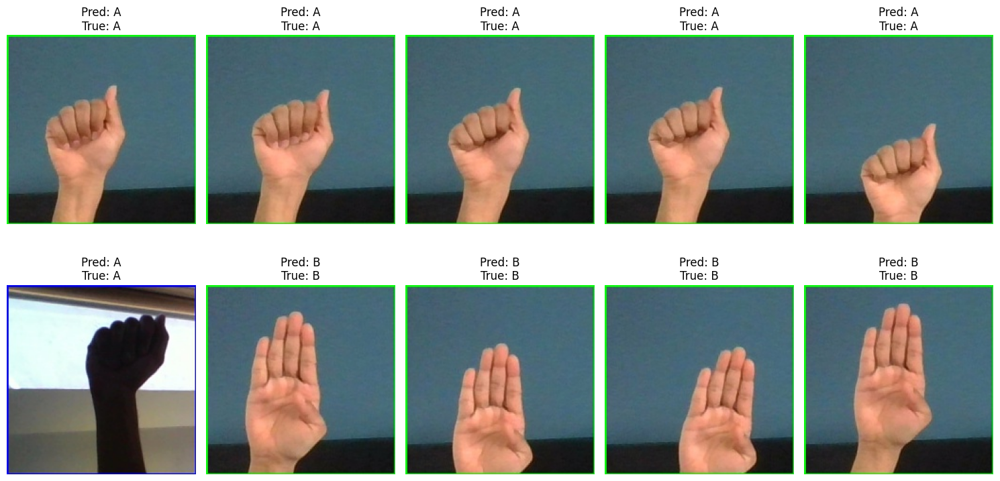

In [ ]:
# Get predictions
pred_probs = mobilenet_finetuned.predict(test_generator_mobilenet)
pred_classes = np.argmax(pred_probs, axis=1)

# True labels
true_classes = test_generator_mobilenet.classes
class_labels = list(test_generator_mobilenet.class_indices.keys())

# Filenames for images
filenames = test_generator_mobilenet.filenames

# Find correct predictions
correct_indices = np.where(pred_classes == true_classes)[0]

# Display first N correct predictions
N = 10  # Change this to see more/less images
plt.figure(figsize=(15, 8))
for i, idx in enumerate(correct_indices[:N]):
    img_path = os.path.join(test_generator_mobilenet.directory, filenames[idx])
    img = plt.imread(img_path)

    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Pred: {class_labels[pred_classes[idx]]}\nTrue: {class_labels[true_classes[idx]]}")
plt.tight_layout()
plt.show()

<span style="color:transparent;">Real-Time Testing</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h1 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Real-Time Testing</h1>
</div>

In [2]:
#Import the libraries for the specific models
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg16 import preprocess_input

#Load model
model = load_model("D:/Data/Study/Research Practicum/Project/.venv/Huge_models/vgg16_finetuned_best_3_1.h5")

#Specify image dimensions specific to the model
IMG_SIZE = 224

In [3]:
# Define class names
CLASS_NAMES = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'Nothing', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

In [7]:
# Initialize MediaPipe
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=False, max_num_hands=1, min_detection_confidence=0.7)

# Start webcam
cap = cv2.VideoCapture(0)

# Text state
confirmed_text = ""
last_confirmed_char = ""
current_prediction = ""

# Font config
font_small = cv2.FONT_HERSHEY_SIMPLEX
font_scale_small = 0.6
font_thickness = 1

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.flip(frame, 1)
    roi_start = 100
    roi_end = roi_start + IMG_SIZE
    roi = frame[roi_start:roi_end, roi_start:roi_end]

    # Draw ROI box
    cv2.rectangle(frame, (roi_start, roi_start), (roi_end, roi_end), (255, 0, 0), 2)

    # Detect hands
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = hands.process(frame_rgb)

    current_prediction = ""

    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            for lm in hand_landmarks.landmark:
                h, w, _ = frame.shape
                cx, cy = int(lm.x * w), int(lm.y * h)

                if roi_start <= cx <= roi_end and roi_start <= cy <= roi_end:
                    roi_resized = cv2.resize(roi, (IMG_SIZE, IMG_SIZE))
                    input_img = preprocess_input(roi_resized)
                    input_img = np.expand_dims(input_img, axis=0)

                    preds = model.predict(input_img, verbose=0)
                    class_idx = np.argmax(preds)
                    confidence = np.max(preds)

                    if confidence > 0.85:
                        current_prediction = CLASS_NAMES[class_idx]
                        cv2.putText(frame, f"{current_prediction} ({confidence*100:.1f}%)",
                                    (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 2)
                    break

    # Handle key events
    key = cv2.waitKey(1) & 0xFF

    if key == ord('p') and current_prediction and current_prediction != last_confirmed_char:
        confirmed_text += current_prediction
        last_confirmed_char = current_prediction

    elif key == ord('b') and confirmed_text:
        confirmed_text = confirmed_text[:-1]
        last_confirmed_char = ""  # allow re-confirmation if deleted

    elif key not in [ord('p'), ord('b')]:
        last_confirmed_char = ""

    # Draw text history
    cv2.putText(frame, f"Text: {confirmed_text}", (10, 450),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (50, 200, 255), 2)

    # Show instructions in top-right
    instructions = [
        "Instructions:",
        "'P' = Confirm sign",
        "'B' = Backspace",
        "'Q' = Quit"
    ]

    frame_width = frame.shape[1]
    padding = 10

    for i, line in enumerate(instructions):
        (text_width, _), _ = cv2.getTextSize(line, font_small, font_scale_small, font_thickness)
        x = frame_width - text_width - padding
        y = 30 + i * 20
        cv2.putText(frame, line, (x, y),
                    font_small, font_scale_small, (180, 180, 180), font_thickness)

    # Display frame
    cv2.imshow("ASL Recognition", frame)

    if key == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


<span style="color:transparent;">Real-Time Testing Sample Images</span>
<div style="border-radius: 15px 0 15px 0px; border: 2px solid #f1c40f; padding: 10px; background-color: #faebd7; text-align: center; box-shadow: 0px 2px 4px rgba(0, 0, 0, 0.2);">
    <h2 style="color: #191970; text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5); font-weight: bold; margin-bottom: 10px; font-size: 24px;">Real-Time Testing Sample Images</h2>
</div>

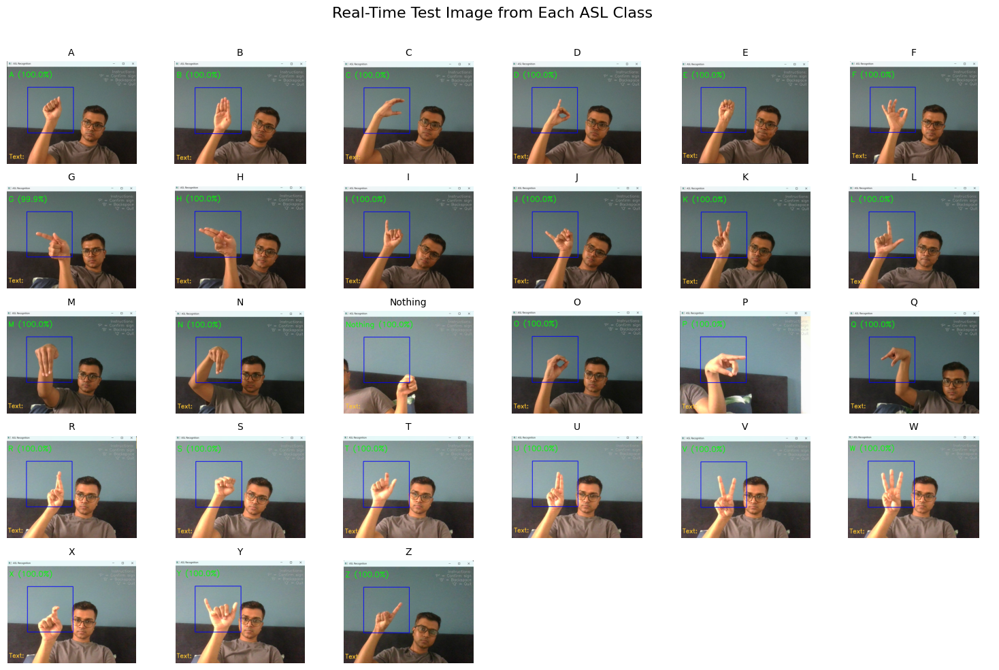

In [ ]:
# Path to your folder containing Real-Time Testing sample images (one per class)
image_folder = r"D:/Data/Study/Research Practicum/Project/.venv/Real-Time Test"
# Get all images in the folder
images = sorted([f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))])

# Titles for each image (assuming filenames are like A.jpg, B.png, etc.)
titles = [os.path.splitext(img)[0] for img in images]  

# Grid size (5 rows x 6 columns for 27 classes: 26 letters + "Nothing")
rows, cols = 5, 6  

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
fig.suptitle("Real-Time Test Image from Each ASL Class", fontsize=16)

# Plot each image in the grid
for idx, ax in enumerate(axes.flat):
    if idx < len(images):
        img = mpimg.imread(os.path.join(image_folder, images[idx]))
        ax.imshow(img)
        ax.set_title(titles[idx], fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Adjust to make title visible
plt.show()